In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from Bio import SeqIO
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.cluster import KMeans
import seaborn as sns
import pca as pc
from adjustText import adjust_text

# conda activate pca

# scripts and variables

In [ ]:
color_map_main = {
    "ECEG":"#11819f",
    "FH":"#00c6c2",
    "GE":"#11819f",
    "IB":"#00c6c2",
    "IV":"#11819f",
    "MO":"#11819f",
    "PC":"#11819f",
    "SF":"#11819f",

    "FISH":"#770076",
    "BULD":"#770076",
    "WALR":"#770076",
    "SUGL":"#770076",
    "IONY":"#ff00ae",
    "RAYK":"#ff00ae",
    "KOZ": "#ff00ae",
    "YAMS":"#ff00ae",
    "HAZY":"#f9f871",
    "WSIS":"#f9f871",
    "TRIA":"#f9f871",
    "GRGR":"#f9f871",
}

color_map_suppl = {
    "ECEG":"#11819f",
    "FH":"#00c6c2",
    "GE":"#d0d3fb",
    "IB":"#00c6c2",
    "IV":"#11819f",
    "MO":"#11819f",
    "PC":"#d0d3fb",
    "SF":"#11819f",

    "FISH":"#770076",
    "BULD":"#770076",
    "WALR":"#770076",
    "SUGL":"#770076",
    "IONY":"#770076",
    "RAYK":"#770076",
    "KOZ": "#770076",
    "YAMS":"#770076",
    "HAZY":"#f9f871",
    "WSIS":"#f9f871",
    "TRIA":"#f9f871",
    "GRGR":"#f9f871",
}

perplexity={"GSL":94, "SSL":32}

In [3]:
label_list_autosomes=["G352", # Gulf
            "G571","G572","G573","G575","G578", # Southern
            "Anso01","Anso06","AnsoTO03", # Northern
            "IV01","IV04","IV05","IV08","MO07", # Central
            "PC16", # Northern
            "IB09","IB12","IB14", # Western
            "P202","K223","K226","K227", # Asian
            "X31","F6","F4","ssl871","ssl872", # Western
            "Hi7","SSl56","Y71","Trlis6","Trlis8" # Eastern
            ]
label_list_x=["G352", # Gulf
        "G571","G572","G580", # Southern
        "8203","8212","Anso14", # Northern
        "EC04","EG02","IV01","IV02","IV03","IV05","IV07","IV08","IV09","MO01","MO04","MO07","MO35","SF03","SF12","SF40","SF43", # Central
        "GE05","GE11","PC03","PC05","PC16","PC25","PC28", # Northern
        "FH06","FH16","FH22","FH23","IB04","IB06","IB07","IB12","IB13","IB14","IB15","IB16","IB18", # Western
        "R208","K223","K226","K227", # Asian
        "Wi8","X26","wi5", # Western
        "Hi23_98","SSl56","Trlis6","Trlis8" # Eastern
        ]

In [ ]:
def plot_pca(pcs, evar, samples, clusters, label_list, 
             figsize=(5.5, 4), dpi=900, 
             color_map=color_map_main, 
             mirror_by=[], loc="left", 
             hide_labels=True):
    sns.set_theme(style="white", context="talk")
    plt.figure(figsize=figsize, dpi=dpi)

    # colors by population
    pops, _, _, sex =pc.get_population_species(samples, withsex=True)
    colors = [color_map.get(pop, "#808080") for pop in pops]

    # shapes by cluster
    markers = ["o", "p", "H", "v", "^", "*", "s", "D", "P"]

    texts = []
    for i, (x, y) in enumerate(pcs):
        for mirror_axes in mirror_by:
            if mirror_axes == "y":
                y = -y
            if mirror_axes == "x":
                x = -x
        edge_color='black'
        plt.scatter(
            x, y,
            c=colors[i],
            marker=markers[clusters[i] % len(markers)],
            s=250,
            edgecolor=edge_color,
            linewidth=0.8
        )
        if samples[i] in label_list:
            texts.append(
                plt.text(x, y, samples[i],
                        fontsize=9, ha='center', va='center', color='black')
            )

    adjust_text(texts,
                expand_points=(1.0, 1.0))

    plt.axhline(0, color='lightgray', lw=1.5, zorder=0)
    plt.axvline(0, color='lightgray', lw=1.5, zorder=0)
    plt.xlabel(f"PC1 ({evar[0]*100:.1f}%)", fontsize=18)
    plt.ylabel(f"PC2 ({evar[1]*100:.1f}%)", fontsize=18)

    ax = plt.gca()
    if hide_labels:
        ax.tick_params(labelbottom=False, labelleft=False)
    ax.yaxis.set_label_position(loc)
    for spine in ax.spines.values():
        spine.set_color("lightgrey")
        spine.set_linewidth(1.5)

    plt.tight_layout()
    plt.show()

In [ ]:
def get_pca_geno(geno_file, label_list=None, n_clusters=1, scaler=False, filename="pca.csv", 
                 figsize=(5.5, 4), dpi=900, color_map=color_map_main, 
                 mirror_by=[], loc="left", hide_labels=False):
    raw = pd.read_csv(geno_file, sep=r"\s+")
    samples=raw["IID"].to_list()

    # Columns: FID IID PAT MAT SEX PHENOTYPE SNP1 SNP2 ...
    meta_cols = ["FID","IID","PAT","MAT","SEX","PHENOTYPE"]
    X = raw.drop(columns=meta_cols) # keep only genotype columns
    X = X.replace(-9, np.nan).replace("NA", np.nan)  # missing coded as -9 or NA

    # mean-impute per SNP
    X = X.fillna(X.mean(axis=0))

    # scaler
    if scaler:
        scaler = StandardScaler(with_mean=True, with_std=True)
        # scaler = RobustScaler()
    X_scaled = scaler.fit_transform(X) if scaler else X

    # pca
    svd_solver="randomized"
    pca = PCA(n_components=2, svd_solver=svd_solver, random_state=42)
    pcs = pca.fit_transform(X_scaled)
    pc.pc_into_csv(pcs, samples, filename)

    # Kmeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=50)
    clusters = kmeans.fit_predict(pcs)

    plot_pca(pcs=pcs,
             evar=pca.explained_variance_ratio_,
             samples=samples,
             clusters=clusters,
             label_list=label_list,
             figsize=figsize, dpi=dpi, color_map=color_map, mirror_by=mirror_by, loc=loc, hide_labels=hide_labels)
    return samples, clusters

# FIGURES

In [ ]:
basepath=""

## MAIN FIGURES

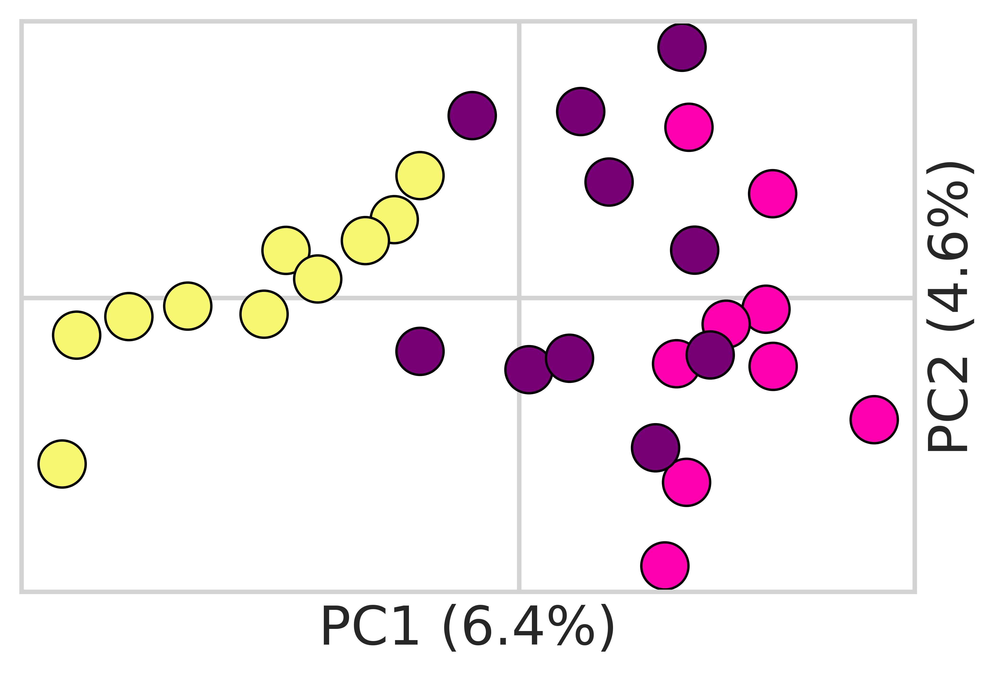

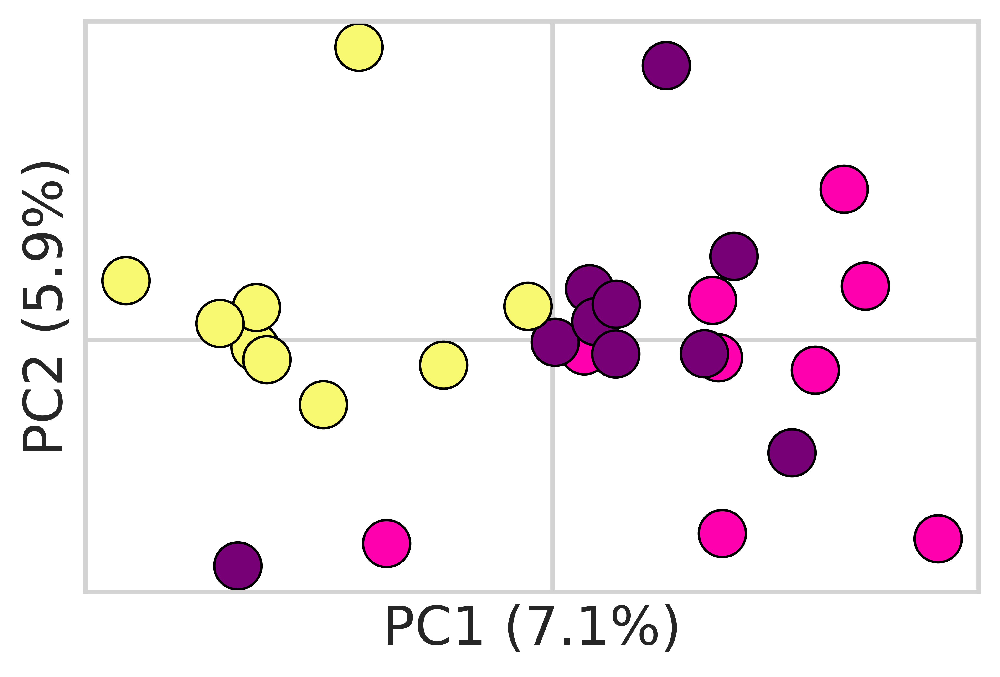

In [ ]:
# autosomes
geno_file_ssl = f"{basepath}/VARCALL/vcf/SSL_CM019810.2/PCA/SSL_CM019810.2.MQ30.BQ30.snps._hom._repOtZC.Q40_DP10000mean0.5_NA0.1_bias0.5_het0.5_PI_116707pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, scaler=False, figsize=(5, 3.5), dpi=900, color_map=color_map_main, loc="right")

# X
geno_file_ssl = f"{basepath}/VARCALL/vcf/SSL_CM019819.2/PCA/SSL_CM019819.2.MQ30.BQ30.snps._hom._repOtZC._par.Q40_DP10000mean0.5_NA0.1_bias0.5_het0.5_PI_27459pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, scaler=True, figsize=(5, 3.5), dpi=900, color_map=color_map_main)


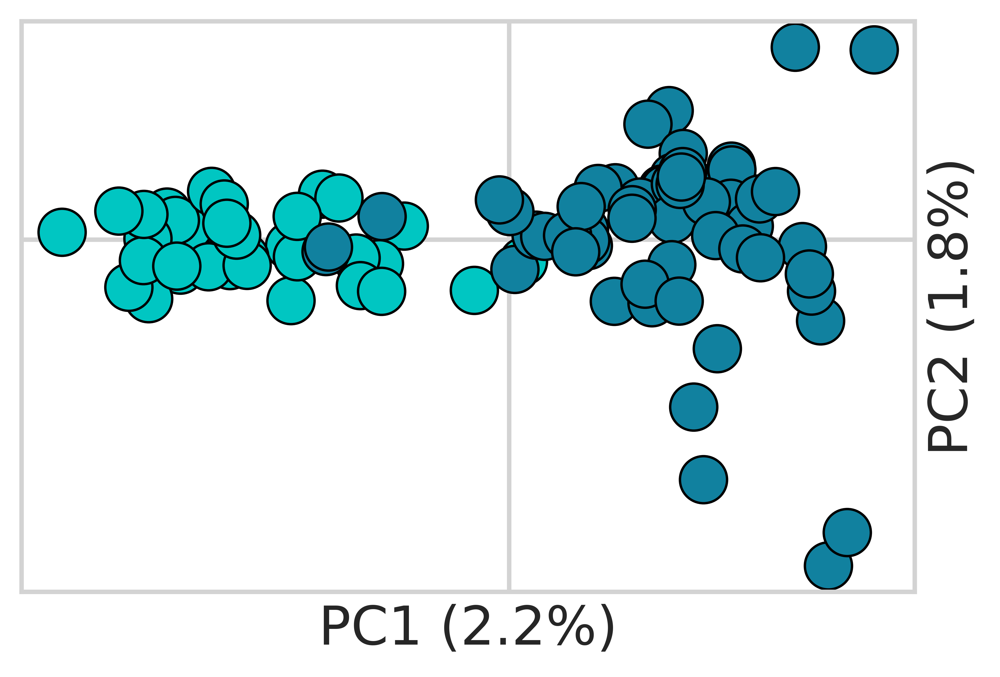

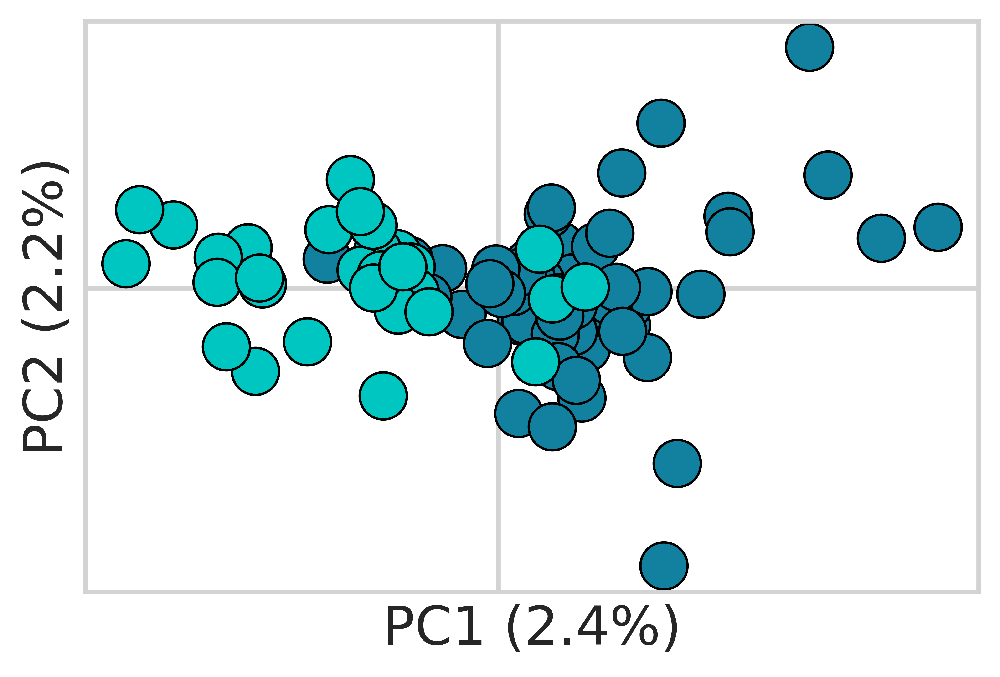

In [ ]:
# autosomes
geno_file_gsl = f"{basepath}/VARCALL/vcf/GSL_MF_CM019810.2/PCA/GSL_MF_CM019810.2.MQ30.BQ30.snps._hom._repOtZC.Q40_DP10000_MQ40_NA10_bias50_PI_112730pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, scaler=False, figsize=(5, 3.5), dpi=900, color_map=color_map_main, loc="right")

# X
geno_file_gsl = f"{basepath}/VARCALL/vcf/GSL_MF_CM019819.2/PCA/GSL_MF_CM019819.2.MQ30.BQ30.snps._hom._repOtZC._par.Q40_DP10000_MQ40_NA10_bias50_PI_30928pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, scaler=True, figsize=(5, 3.5), dpi=900, color_map=color_map_main, mirror_by=["x"])


## SUPPLEMENTARY FIGURES

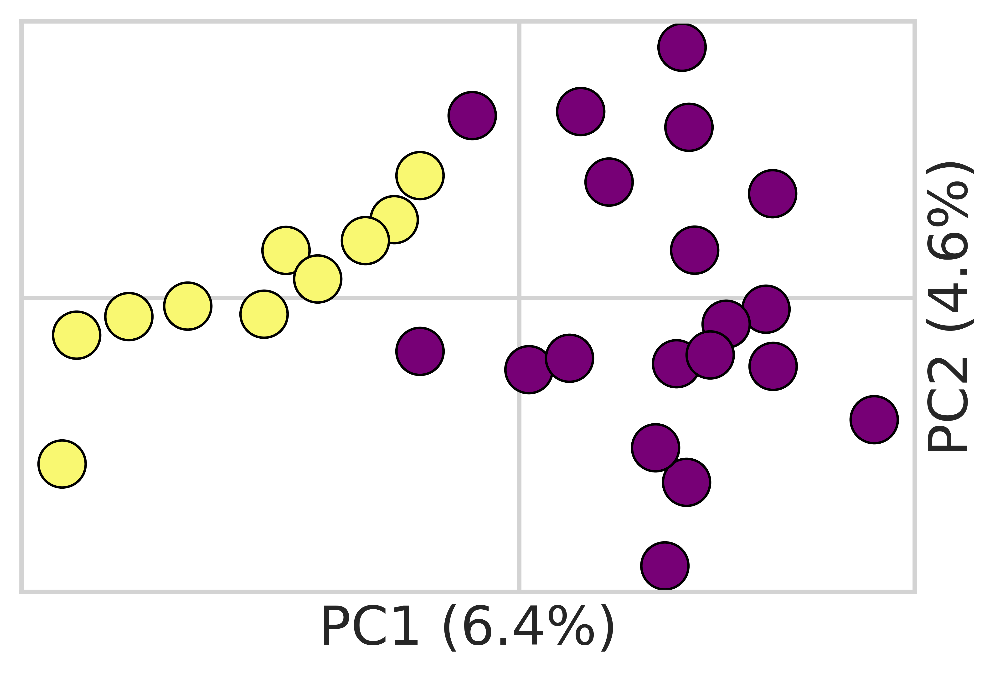

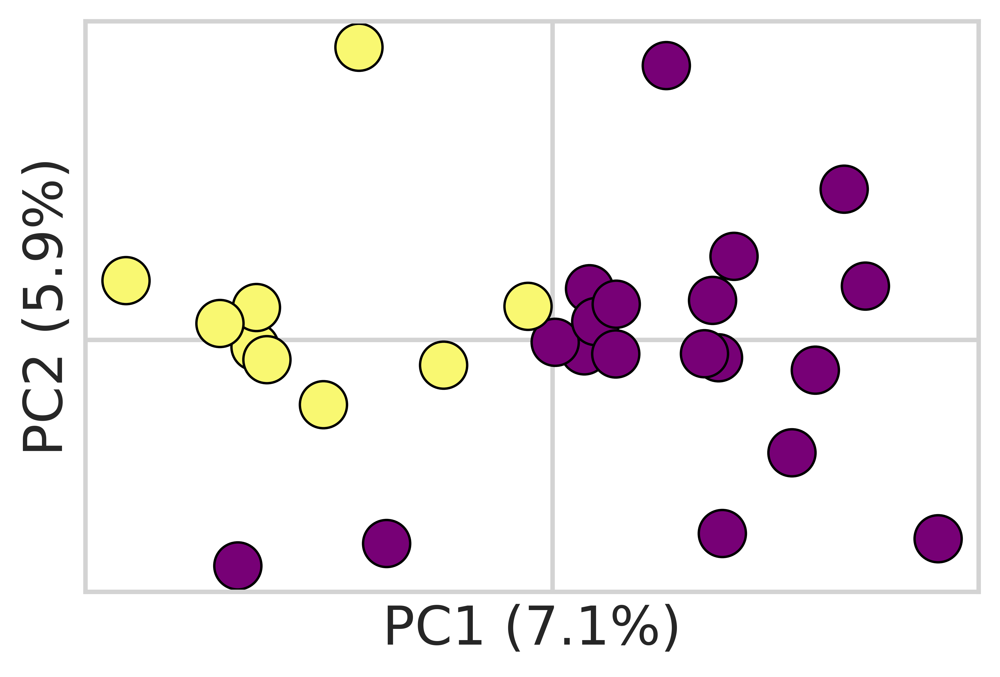

In [ ]:
# autosomes
geno_file_ssl = "{basepath}/VARCALL/vcf/SSL_CM019810.2/PCA/SSL_CM019810.2.MQ30.BQ30.snps._hom._repOtZC.Q40_DP10000mean0.5_NA0.1_bias0.5_het0.5_PI_116707pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, scaler=False, figsize=(5, 3.5), dpi=900, color_map=color_map_suppl, loc="right")

# X
geno_file_ssl = "{basepath}/VARCALL/vcf/SSL_CM019819.2/PCA/SSL_CM019819.2.MQ30.BQ30.snps._hom._repOtZC._par.Q40_DP10000mean0.5_NA0.1_bias0.5_het0.5_PI_27459pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, scaler=True, figsize=(5, 3.5), dpi=900, color_map=color_map_suppl)


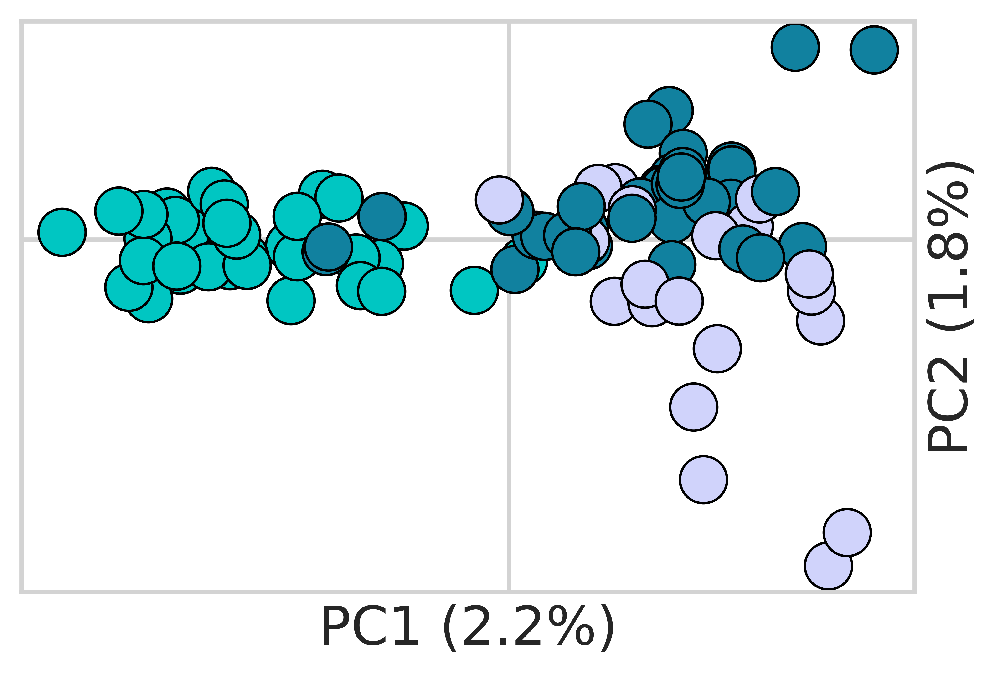

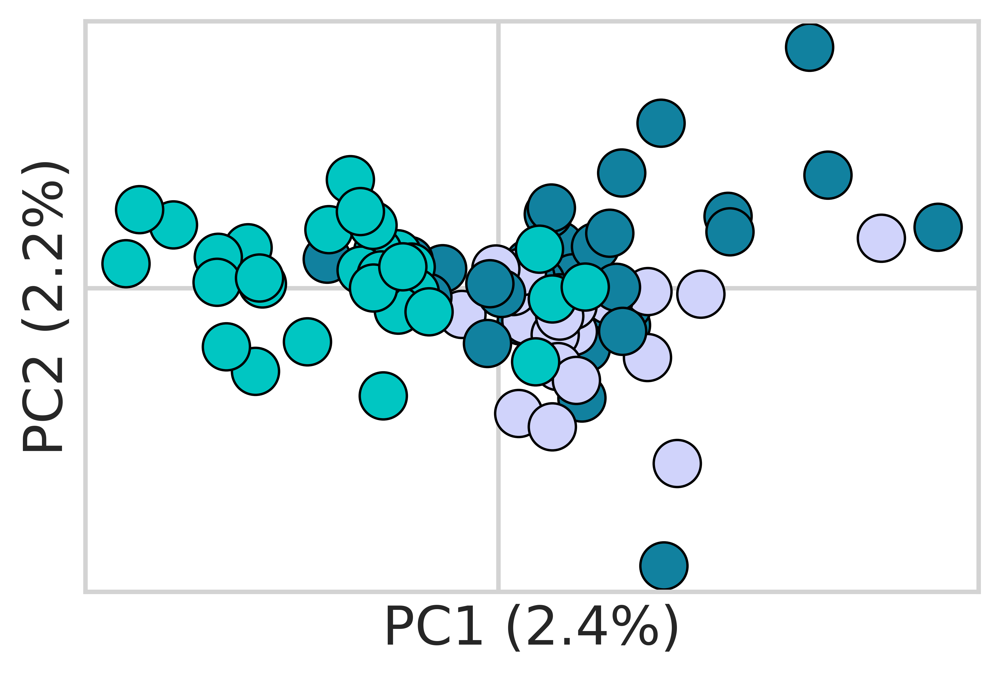

In [ ]:
# autosomes
geno_file_gsl = f"{basepath}/VARCALL/vcf/GSL_MF_CM019810.2/PCA/GSL_MF_CM019810.2.MQ30.BQ30.snps._hom._repOtZC.Q40_DP10000_MQ40_NA10_bias50_PI_112730pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, scaler=False, figsize=(5, 3.5), dpi=900, color_map=color_map_suppl, loc="right")

# X
geno_file_gsl = f"{basepath}/VARCALL/vcf/GSL_MF_CM019819.2/PCA/GSL_MF_CM019819.2.MQ30.BQ30.snps._hom._repOtZC._par.Q40_DP10000_MQ40_NA10_bias50_PI_30928pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, scaler=True, figsize=(5, 3.5), dpi=900, color_map=color_map_suppl, mirror_by=["x"])


# FOR SUPPLEMENTARY TEXT

## baseline

##### chr9

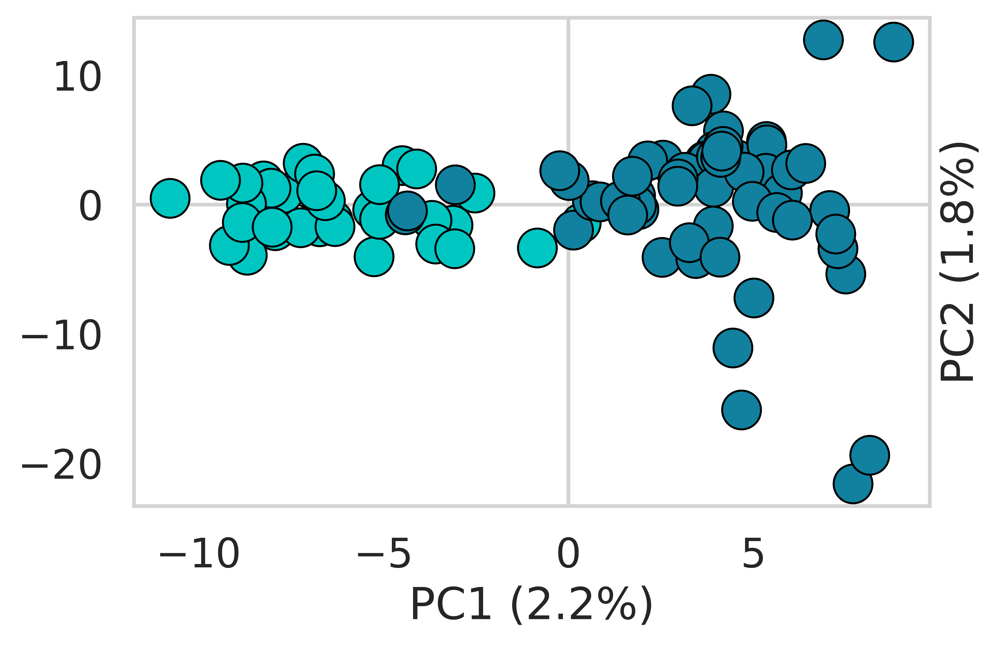

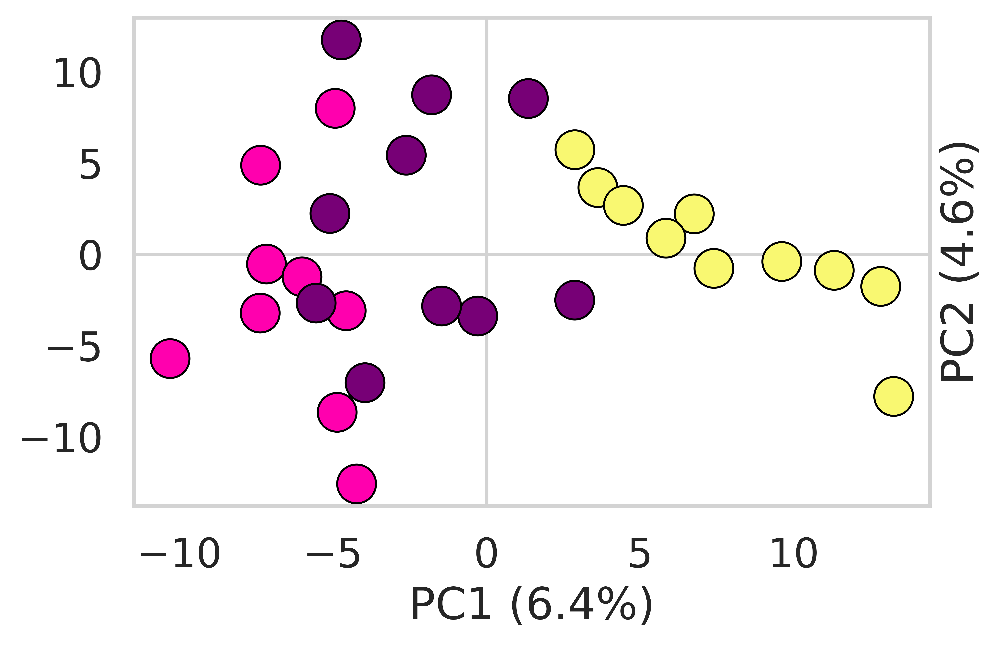

In [ ]:
# GSL
geno_file_gsl = f"{basepath}/VARCALL/vcf/GSL_MF_CM019810.2/PCA/GSL_MF_CM019810.2.MQ30.BQ30.snps._hom._repOtZC.Q40_DP10000_MQ40_NA10_bias50_PI_112730pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, scaler=False, figsize=(6, 4), dpi=900, color_map=color_map_main, loc="right")

# SSL
geno_file_ssl = "{basepath}/VARCALL/vcf/SSL_CM019810.2/PCA/SSL_CM019810.2.MQ30.BQ30.snps._hom._repOtZC.Q40_DP10000mean0.5_NA0.1_bias0.5_het0.5_PI_116707pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, scaler=False, figsize=(6, 4), dpi=900, color_map=color_map_main, loc="right", mirror_by=["x"])


##### X

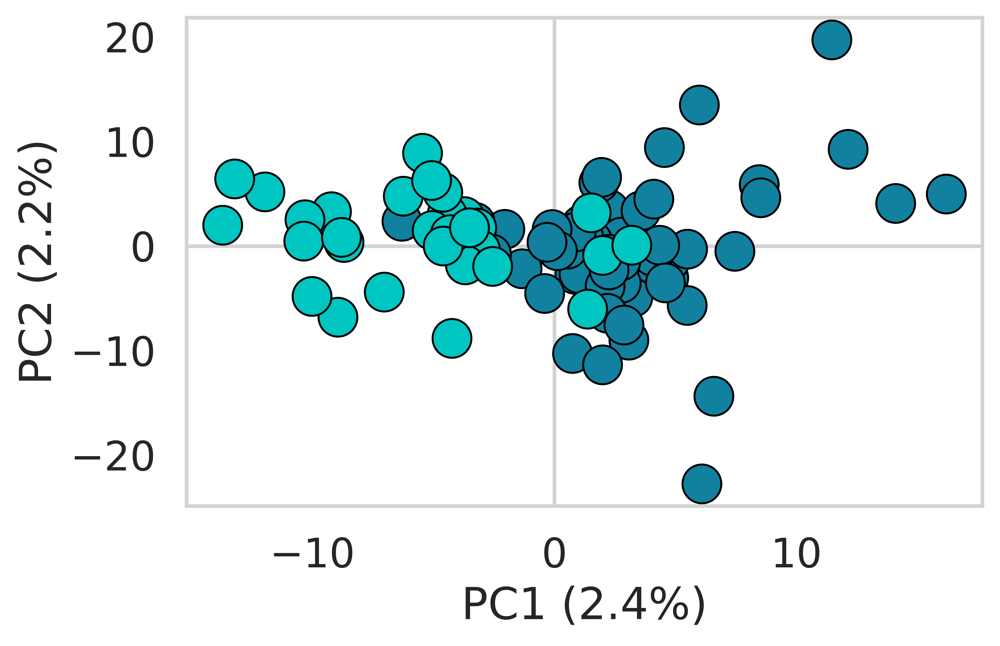

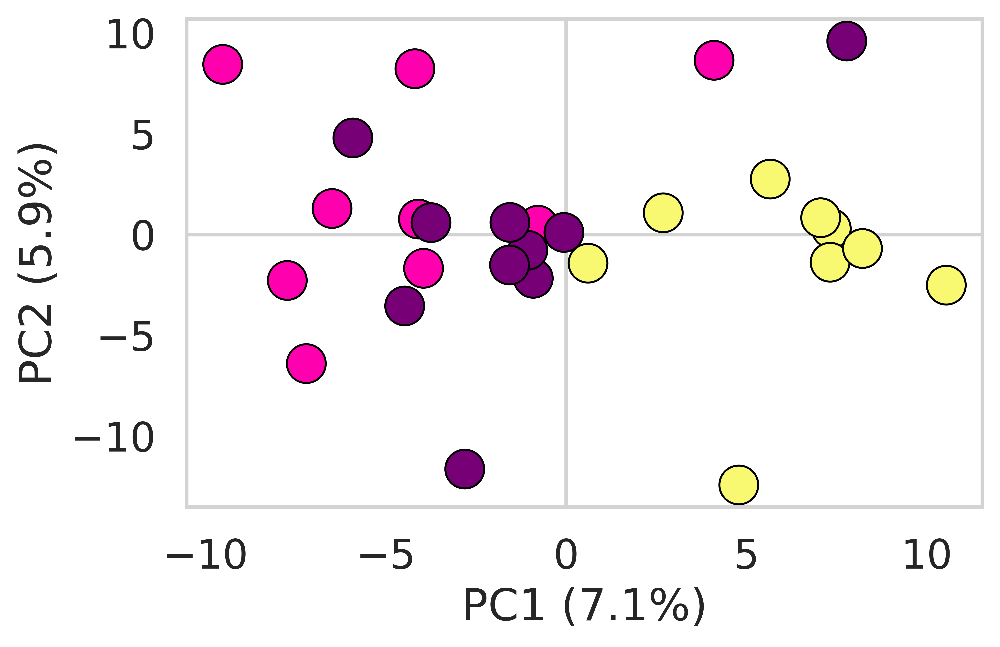

In [ ]:
# GSL
geno_file_gsl = f"{basepath}/VARCALL/vcf/GSL_MF_CM019819.2/PCA/GSL_MF_CM019819.2.MQ30.BQ30.snps._hom._repOtZC._par.Q40_DP10000_MQ40_NA10_bias50_PI_30928pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, scaler=True, figsize=(6, 4), dpi=900, color_map=color_map_main, mirror_by=["x"])

# SSL
geno_file_ssl = "{basepath}/VARCALL/vcf/SSL_CM019819.2/PCA/SSL_CM019819.2.MQ30.BQ30.snps._hom._repOtZC._par.Q40_DP10000mean0.5_NA0.1_bias0.5_het0.5_PI_27459pos.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, scaler=True, figsize=(6, 4), dpi=900, color_map=color_map_main, mirror_by=["x", "y"])


## TEST 2.1 Effect of autosomes reduction to a single representative

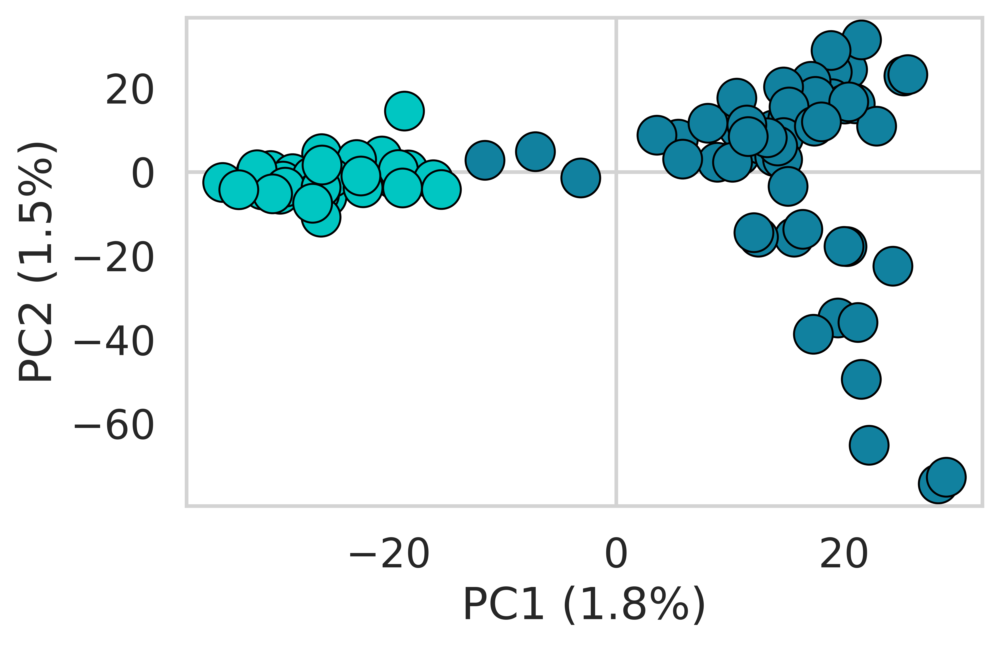

In [ ]:
# ALL AUT, GSL
basepath="{basepath}/VARCALL/vcf_MF_AUT_v"
geno_file_gsl = f"{basepath}/GSL_AUT/PCA/GSL_AUT.MQ20.BQ20.snps.filtered_q.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], color_map=color_map_main, mirror_by=["x"], hide_labels=False, figsize=(6, 4))


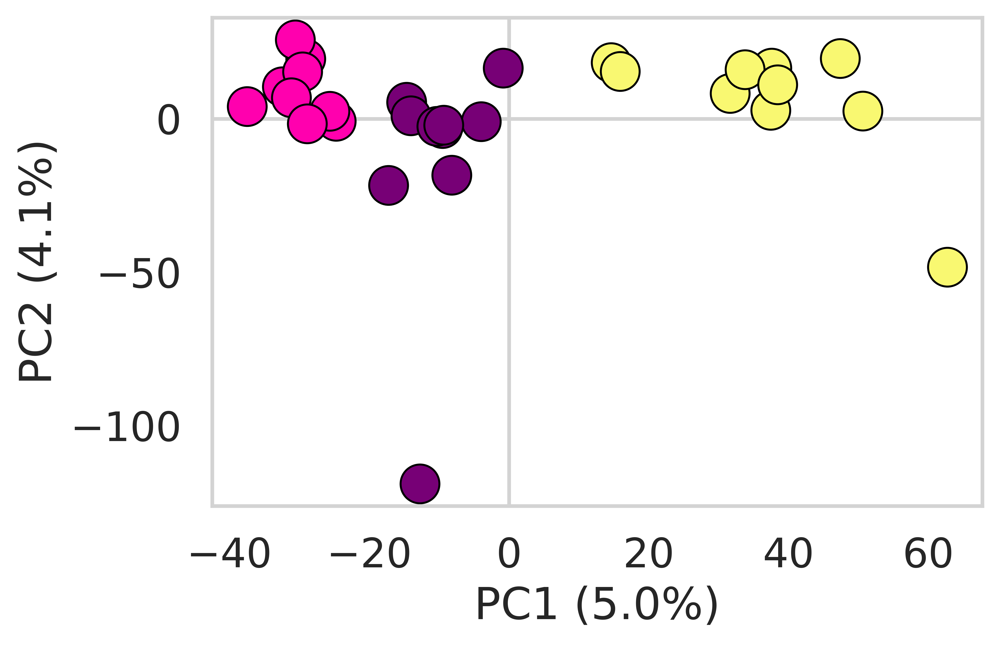

In [ ]:
# ALL AUT SSL
basepath="{basepath}/VARCALL/vcf_MF_AUT_v"
geno_file_ssl = f"{basepath}/SSL_AUT/PCA/SSL_AUT.MQ20.BQ20.snps.filtered_q.vcf.rn.pcain.raw.raw"
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], 
                                 color_map=color_map_main, hide_labels=False, 
                                 figsize=(6, 4), mirror_by=["y"])


## TEST 2.2 Effect of downsampling chromosome 9 

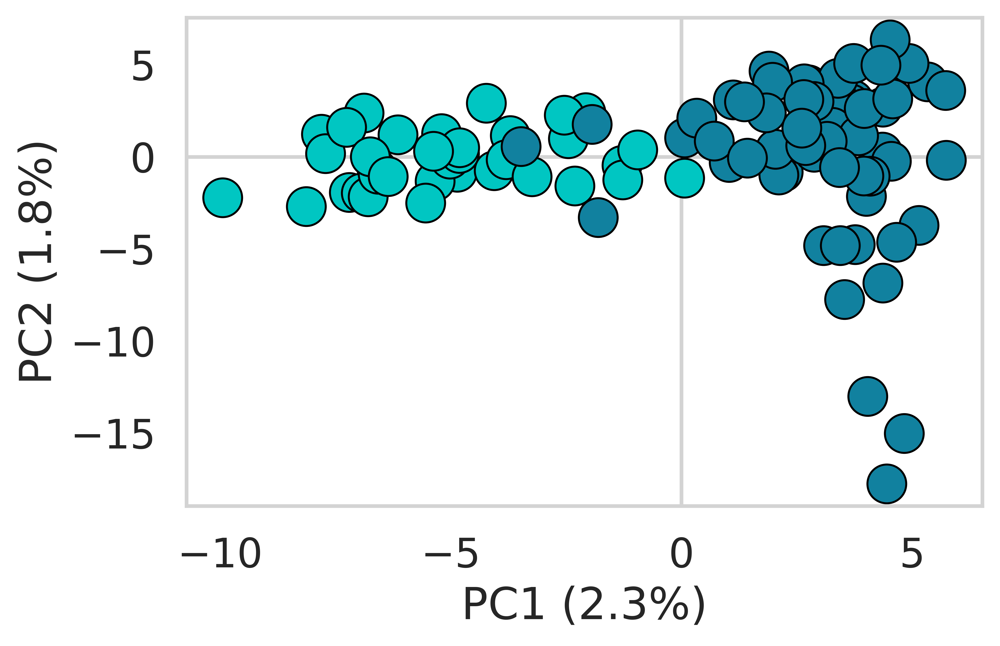

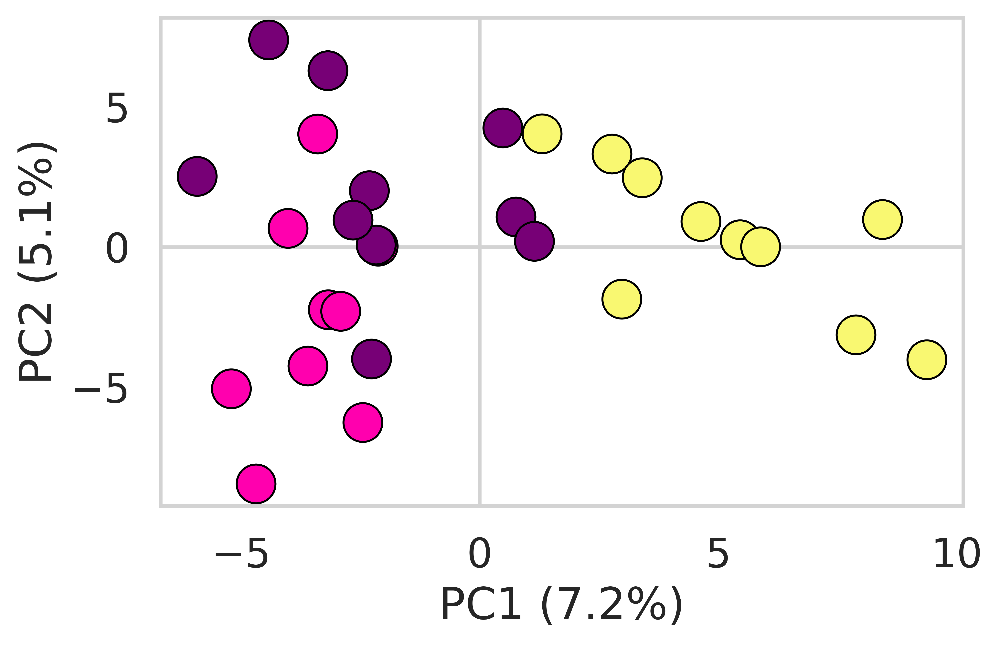

In [ ]:
geno_file_gsl = "{basepath}/2024__SexBias_GeneFlow/Autosomes/resutls/downsamp_chr9/PCA/GSL_finalchr9_downsamp.rn.pcain.raw.raw"
geno_file_ssl = "{basepath}/2024__SexBias_GeneFlow/Autosomes/resutls/downsamp_chr9/PCA/SSL_finalchr9_downsamp.rn.pcain.raw.raw"

samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, color_map=color_map_main, hide_labels=False, figsize=(6, 4), mirror_by=["y"])
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, color_map=color_map_main, hide_labels=False, figsize=(6, 4), mirror_by=["x", "y"])

## TEST 2.3 Effect of pseudohaploidisation

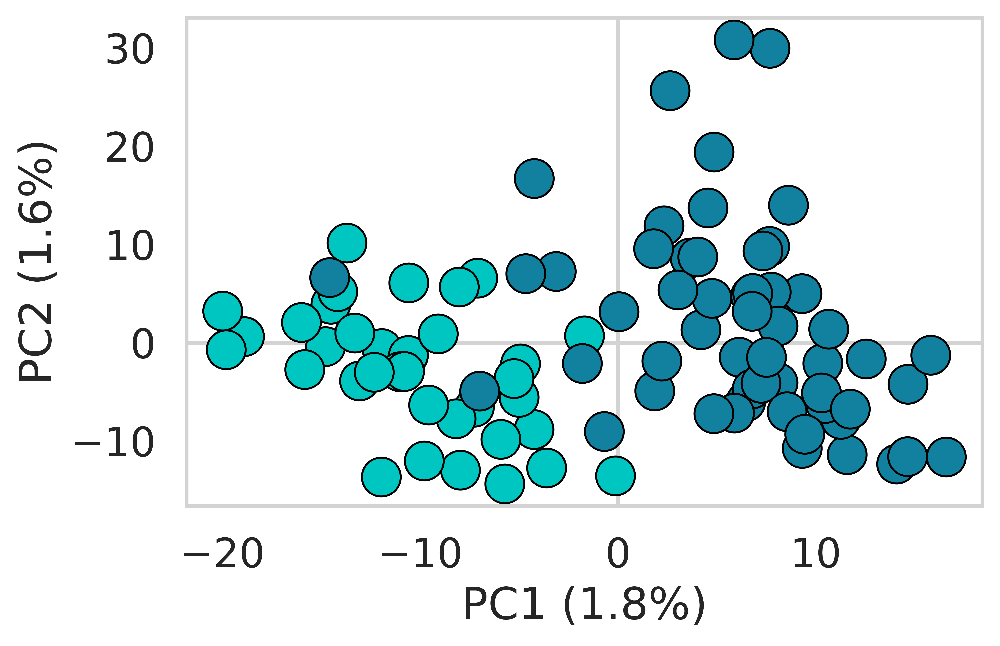

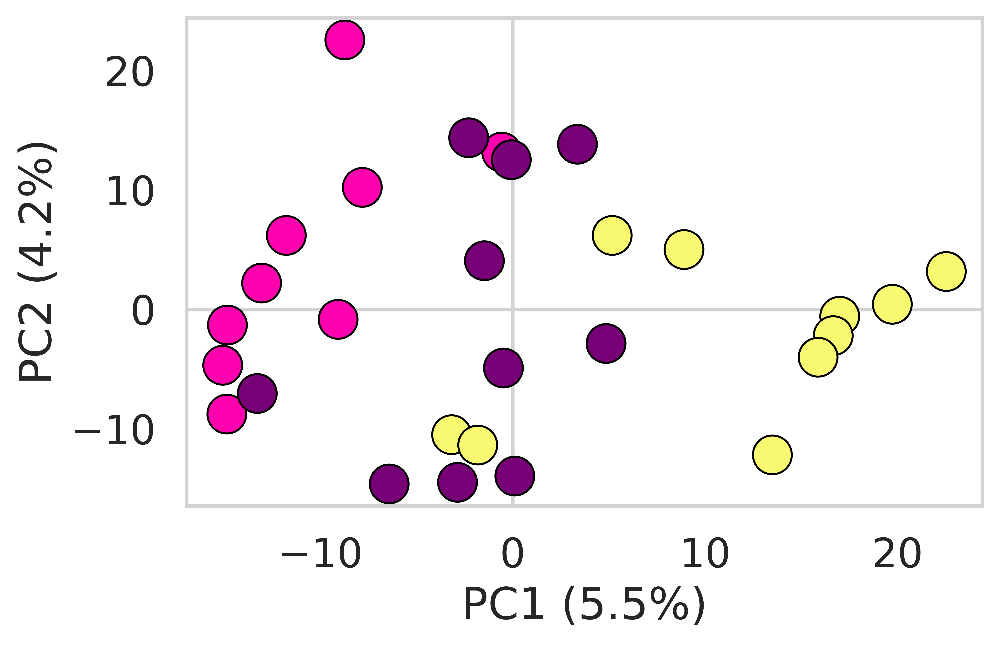

In [ ]:
# AUT
geno_file_gsl = "{basepath}/2024__SexBias_GeneFlow/Autosomes/data/angsd/PCA/02_angsd_chr9__GSL-renamed.rn.pcain.raw.raw"
geno_file_ssl = "{basepath}/2024__SexBias_GeneFlow/Autosomes/data/angsd/PCA/02_angsd_chr9__SSL-renamed.rn.pcain.raw.raw"

samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, color_map=color_map_main, hide_labels=False, figsize=(6, 4), mirror_by=["x"])
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, color_map=color_map_main, hide_labels=False, figsize=(6, 4))

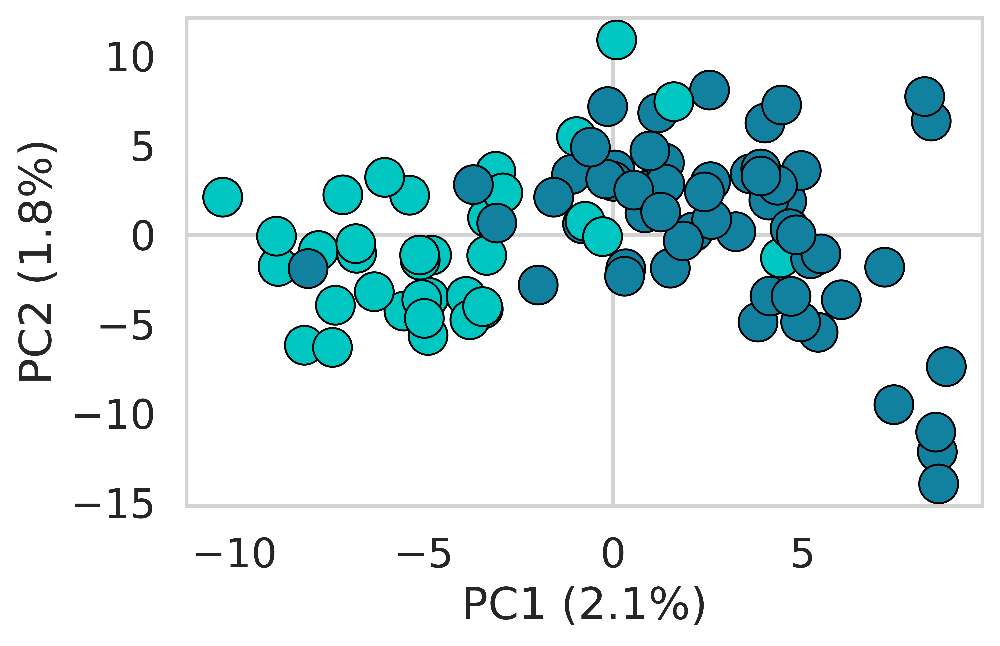

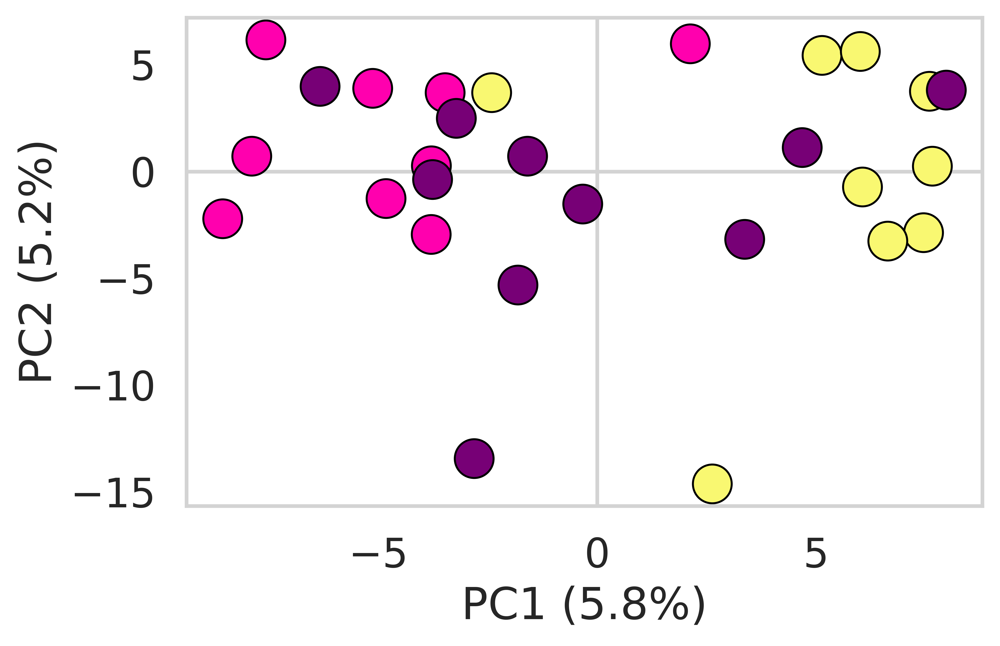

In [ ]:
# X
geno_file_gsl = "{basepath}/2024__SexBias_GeneFlow/Autosomes/data/angsd/PCA/02_angsd_Xchr__GSL-renamed.rn.pcain.raw.raw"
geno_file_ssl = "{basepath}/2024__SexBias_GeneFlow/Autosomes/data/angsd/PCA/02_angsd_Xchr__SSL-renamed.rn.pcain.raw.raw"

samples, clusters = get_pca_geno(geno_file_gsl, label_list=[], n_clusters=1, color_map=color_map_main, hide_labels=False, figsize=(6, 4))
samples, clusters = get_pca_geno(geno_file_ssl, label_list=[], n_clusters=1, color_map=color_map_main, hide_labels=False, figsize=(6, 4), mirror_by=["x"])